## get_obs_paths

The purpose of this notebook is to read in a CSV table containing a column of PACS obsids, and add a column containing the path to a FITS file corresponding to each observation, where available. This is useful if you have a folder full of data downloaded from the *Herschel* Science Archive (HSA) but don't know specifically where the observation you're looking for is located. In particular, the table produced by this notebook can be used as input to the disc modelling code `pacs_model_batch.py`.

The notebook assumes that the data have been downloaded from HSA and placed in some specified root directory, and that the file structure has not been altered following the download &#150; the obsid, level and processing method of a particular image are inferred from its path. An alternative method, independent of the file structure, would be to open *all* FITS files found and extract the relevant information, but this would be much more time-consuming.

For details of the expected format of the input table, see `input/obs_list.csv`.

<!--It is also expected that the input table includes columns `wave` and `star_jy`, containing wavelengths and predicted stellar fluxes for each system at 70/100 μm (i.e. there are at least two rows for each system). For the final output table, the appropriate row will be selected, given the wavelength of the obsid as determined from the FITS file.-->

### Setup

In [1]:
import pandas as pd
import numpy as np
from astropy.io import fits
from pathlib import Path

In [2]:
#don't truncate path strings when displaying them in a DataFrame
pd.set_option('display.max_colwidth', -1)

#display the full tables
pd.set_option('display.max_rows', None)

### Obtain a list of relevant images

This is achieved by walking recursively through all directories contained in `rootdir` and appending the paths that match one of the specified patterns to a list. Here, we look for level 2 and level 2.5 high-pass filtered "blue" (70/100 μm) images.

In [3]:
#all data should be somewhere inside this directory
rootdir = '/data/wyatt_archive/gkennedy/hsa/auto'

#look for files matching these patterns
patterns = ['*/level2_5/HPPHPFMAPB/*.fits.gz*/', '*/level2/HPPPMAPB/*.fits.gz']

In [4]:
#get the paths of all desired maps within rootdir

path = []
obsid_from_path = []
mtime = []
obs_wave = []
level = []

#match each of the appropriate patterns
for pattern in patterns:
    
    for p in Path(rootdir).rglob(pattern):

        full_path = p.resolve()
        path.append(str(full_path))

        #need to go three levels up to get the obsid, given the file structure provided by HSA
        obsid_from_path.append(int(full_path.parents[2].name))
        
        #the processing level can be determined from the directory two levels up
        level.append(full_path.parents[1].name)

        #append the last modification time, so that we can find the most up-to-date file if duplicates are found
        mtime.append(p.lstat().st_mtime)

        #extract observation wavelength from FITS file
        with fits.open(str(full_path))as datafile:
            obs_wave.append(int(datafile[0].header['WAVELNTH']))

In [5]:
#store the results in a DataFrame, so that we can easily join them onto the provided CSV table
df_paths = pd.DataFrame({'obsid': obsid_from_path, 'obs_wave': obs_wave, 'level': level, 'path': path, 'mtime': mtime},
                        columns = ['obsid', 'obs_wave', 'level', 'path', 'mtime'])

#sort by obsid and then level, with the highest levels and newest files (i.e. largest mtimes) at the top
df_paths.sort_values(by = ['obsid', 'level', 'mtime'], ascending = [True, False, False], inplace = True)

In [6]:
#if multiple images were found for a particular obsid, keep those with the
#highest level of processing, and from those, only the most recently modified file
df_paths.drop_duplicates(subset = ['obsid'], keep = 'first', inplace = True)

#modification times were only necessary for sorting; drop these now
df_paths.drop(['mtime'], axis = 1, inplace = True)

In [7]:
#look at the final path table
df_paths

,obsid,obs_wave,level,path
8,1342186612,70,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292694/1342186612/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_blue_0547_m5104_00_v1.0_1470446695527.fits.gz
9,1342186619,70,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292695/1342186619/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_blue_1837_p3847_00_v1.0_1470459933858.fits.gz
5,1342187075,100,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292685/1342187075/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_green_2009_m6611_00_v1.0_1470425839613.fits.gz
2046,1342187141,100,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292687/1342187141/level2/HPPPMAPB/hpacs1342187141_20hpppmapb_00_1469223675154.fits.gz
2047,1342187142,70,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292689/1342187142/level2/HPPPMAPB/hpacs1342187142_20hpppmapb_00_1469222237189.fits.gz
6,1342187145,100,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292690/1342187145/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_green_2218_m5338_00_v1.0_1470430547048.fits.gz
2035,1342187248,100,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292664/1342187248/level2/HPPPMAPB/hpacs1342187248_20hpppmapb_00_1469224771737.fits.gz
2048,1342187255,100,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292692/1342187255/level2/HPPPMAPB/hpacs1342187255_20hpppmapb_00_1469225267977.fits.gz
2044,1342187338,70,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292682/1342187338/level2/HPPPMAPB/hpacs1342187338_20hpppmapb_00_1469225756493.fits.gz
2045,1342187342,70,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292684/1342187342/level2/HPPPMAPB/hpacs1342187342_20hpppmapb_00_1469226680192.fits.gz


### Read in the CSV table 

In [8]:
csv_filename = 'input/obs_list.csv'
df_in = pd.read_csv(csv_filename)

In [9]:
#look at the input table
df_in

,obsid,xid,dist_pc,filter,wave,model_jy,star_jy,chi_star,ra_obs,de_obs
0,1342231387,* 19 LMi,28.809477,PACS100,100,1.036010e-02,1.036010e-02,NaN,149.420552,41.055547
1,1342231387,* 19 LMi,28.809477,PACS70,70,2.104510e-02,2.104510e-02,-0.197547,149.420552,41.055547
2,1342237460,* 29 Ari,28.688807,PACS100,100,5.800630e-03,5.800630e-03,NaN,38.225520,15.034699
3,1342237460,* 29 Ari,28.688807,PACS70,70,1.176720e-02,1.176720e-02,0.625082,38.225520,15.034699
4,1342233372,2MASS J08101691-4856291,5055.611729,PACS100,100,1.591280e-02,1.795130e-05,29.482400,122.570457,-48.941435
5,1342233372,2MASS J08101691-4856291,5055.611729,PACS70,70,2.890060e-02,3.624850e-05,26.904000,122.570457,-48.941435
6,1342265601,CD-54 4621,110.619469,PACS100,100,1.753910e-03,2.498080e-04,-0.716606,183.148780,-55.340955
7,1342265601,CD-54 4621,110.619469,PACS70,70,3.424640e-03,5.048320e-04,NaN,183.148780,-55.340955
8,1342265609,CD-52 5008,137.741047,PACS100,100,4.760760e-03,3.269810e-04,2.573040,185.638297,-53.563641
9,1342265609,CD-52 5008,137.741047,PACS70,70,7.120900e-03,6.629030e-04,NaN,185.638297,-53.563641


### Left join the path table onto the input table

The rows of the resulting table will be the same as that of the input table, with a path column added.

In [10]:
merged = pd.merge(df_in, df_paths, how = 'left', on = 'obsid')

In [11]:
#look at the merged table
merged

,obsid,xid,dist_pc,filter,wave,model_jy,star_jy,chi_star,ra_obs,de_obs,obs_wave,level,path
0,1342231387,* 19 LMi,28.809477,PACS100,100,1.036010e-02,1.036010e-02,NaN,149.420552,41.055547,70,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278294084/1342231387/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_blue_0958_p4103_00_v1.0_1471855756793.fits.gz
1,1342231387,* 19 LMi,28.809477,PACS70,70,2.104510e-02,2.104510e-02,-0.197547,149.420552,41.055547,70,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278294084/1342231387/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_blue_0958_p4103_00_v1.0_1471855756793.fits.gz
2,1342237460,* 29 Ari,28.688807,PACS100,100,5.800630e-03,5.800630e-03,NaN,38.225520,15.034699,70,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278294097/1342237460/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_blue_0233_p1502_00_v1.0_1471942106823.fits.gz
3,1342237460,* 29 Ari,28.688807,PACS70,70,1.176720e-02,1.176720e-02,0.625082,38.225520,15.034699,70,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278294097/1342237460/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_blue_0233_p1502_00_v1.0_1471942106823.fits.gz
4,1342233372,2MASS J08101691-4856291,5055.611729,PACS100,100,1.591280e-02,1.795130e-05,29.482400,122.570457,-48.941435,70,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278294133/1342233372/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_blue_0810_m4857_00_v1.0_1471903507890.fits.gz
5,1342233372,2MASS J08101691-4856291,5055.611729,PACS70,70,2.890060e-02,3.624850e-05,26.904000,122.570457,-48.941435,70,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278294133/1342233372/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_blue_0810_m4857_00_v1.0_1471903507890.fits.gz
6,1342265601,CD-54 4621,110.619469,PACS100,100,1.753910e-03,2.498080e-04,-0.716606,183.148780,-55.340955,100,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278294512/1342265601/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_green_1213_m5520_00_v1.0_1472398231574.fits.gz
7,1342265601,CD-54 4621,110.619469,PACS70,70,3.424640e-03,5.048320e-04,NaN,183.148780,-55.340955,100,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278294512/1342265601/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_green_1213_m5520_00_v1.0_1472398231574.fits.gz
8,1342265609,CD-52 5008,137.741047,PACS100,100,4.760760e-03,3.269810e-04,2.573040,185.638297,-53.563641,100,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278294513/1342265609/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_green_1223_m5334_00_v1.0_1472398635616.fits.gz
9,1342265609,CD-52 5008,137.741047,PACS70,70,7.120900e-03,6.629030e-04,NaN,185.638297,-53.563641,100,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278294513/1342265609/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_green_1223_m5334_00_v1.0_1472398635616.fits.gz


In [12]:
#were there any systems on the list that we couldn't find an image for?
n_missing_image = len(merged[pd.isna(merged.path)])
print(("Some" if n_missing_image else "No") + " missing images.")

No missing images.


### Clean up the final table

In [13]:
#select appropriate wavelength and remove unnecessary columns
merged = merged[(merged.wave == merged.obs_wave)][['obsid', 'xid', 'dist_pc', 'wave',
                                                   'star_jy', 'chi_star', 'ra_obs',
                                                   'de_obs', 'level', 'path']]

In [14]:
#convert the stellar flux into mJy, as expected by pacs_model.py
merged.star_jy *= 1000
merged.rename(columns = {"star_jy": "star_mjy"}, inplace = True)

In [15]:
#if we end up with multiple entries for one star in the same obsid, place NaN distances at the bottom
merged.sort_values(by = ['obsid', 'xid', 'dist_pc'], inplace = True)

#and then keep only the first entry for these stars
merged.drop_duplicates(subset = ['obsid', 'xid'], keep = 'first', inplace = True)

In [16]:
#take a look at the result
merged

,obsid,xid,dist_pc,wave,star_mjy,chi_star,ra_obs,de_obs,level,path
2603,1342186612,* bet Pic,19.440124,70,30.683300,17.650900,86.821228,-51.066276,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292694/1342186612/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_blue_0547_m5104_00_v1.0_1470446695527.fits.gz
2757,1342186619,* alf Lyr,7.678722,70,786.301000,15.682600,279.235450,38.784480,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292695/1342186619/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_blue_1837_p3847_00_v1.0_1470459933858.fits.gz
1214,1342187075,* del Pav,6.108362,100,74.044400,0.708844,302.189963,-66.185184,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292685/1342187075/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_green_2009_m6611_00_v1.0_1470425839613.fits.gz
3844,1342187141,* q01 Eri,17.433752,100,8.521610,17.209600,25.623008,-53.741156,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292687/1342187141/level2/HPPPMAPB/hpacs1342187141_20hpppmapb_00_1469223675154.fits.gz
3849,1342187142,* q01 Eri,17.433752,70,17.364300,17.099900,25.623008,-53.741156,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292689/1342187142/level2/HPPPMAPB/hpacs1342187142_20hpppmapb_00_1469222237189.fits.gz
664,1342187145,HD 211415,14.016812,100,12.715700,-2.523530,334.567105,-53.628809,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292690/1342187145/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_green_2218_m5338_00_v1.0_1470430547048.fits.gz
2854,1342187248,2MASS J11015046+5622566,24.449878,100,42.113200,13.062900,165.460746,56.382530,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292664/1342187248/level2/HPPPMAPB/hpacs1342187248_20hpppmapb_00_1469224771737.fits.gz
2696,1342187255,* 51 Peg,15.607929,100,10.378100,0.812497,344.367194,20.768997,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292692/1342187255/level2/HPPPMAPB/hpacs1342187255_20hpppmapb_00_1469225267977.fits.gz
3023,1342187338,2MASS J08431857-7905181,NaN,70,5.944570,NaN,130.827027,-79.088315,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292682/1342187338/level2/HPPPMAPB/hpacs1342187338_20hpppmapb_00_1469225756493.fits.gz
2745,1342187342,V* TW Hya,59.523810,70,2.141890,38.548000,NaN,NaN,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292684/1342187342/level2/HPPPMAPB/hpacs1342187342_20hpppmapb_00_1469226680192.fits.gz


### Save the output

In [17]:
#'input' since this will likely be used as input to pacs_model_batch.py!
output_file = 'input/obs_path_list.csv'

In [18]:
#no need to save the indices
merged.to_csv(output_file, index = False)

## Some miscellaneous experimentation below...

In [19]:
#try joining the other way round (i.e. see which systems we have data for, but weren't in the input list)
missing = pd.merge(df_paths, df_in, how = 'left', on = 'obsid')
missing[pd.isna(missing.xid)]['obsid']

104     1342188473
157     1342188519
478     1342193136
495     1342193140
1628    1342212627
1629    1342212634
2028    1342215496
2107    1342216034
2146    1342216399
2155    1342216424
2266    1342217363
2267    1342217365
2306    1342217458
2307    1342217460
2380    1342217520
2389    1342218699
2548    1342222424
2605    1342223470
2606    1342223472
2607    1342223474
2608    1342223476
2609    1342223478
2610    1342223480
2613    1342223484
2614    1342223486
2639    1342223598
2720    1342224202
2721    1342224204
2722    1342224206
2745    1342224371
2916    1342226701
2917    1342226721
2918    1342226723
2919    1342226725
2920    1342226727
2921    1342227011
2922    1342227013
2943    1342227059
2950    1342227132
2951    1342227134
2952    1342227136
2953    1342227138
2954    1342227140
2955    1342227142
2958    1342227146
2965    1342227308
2966    1342227813
2967    1342227815
2968    1342227817
2969    1342227819
2970    1342227821
2971    1342227823
2972    1342

In [20]:
#look at obsids with more than one star listed
merged[merged.obsid.isin(merged.obsid.value_counts().loc[lambda x: x>1].reset_index()['index'])].sort_values(by = ['obsid','xid'])

,obsid,xid,dist_pc,wave,star_mjy,chi_star,ra_obs,de_obs,level,path
4110,1342187365,* bet Leo,10.999890,100,65.632100,14.549500,177.263493,14.571742,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292668/1342187365/level2/HPPPMAPB/hpacs1342187365_20hpppmapb_00_1469226870160.fits.gz
4372,1342187365,2MASS J11490366+1434197,10.999890,100,65.632100,14.549500,177.263493,14.571742,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292668/1342187365/level2/HPPPMAPB/hpacs1342187365_20hpppmapb_00_1469226870160.fits.gz
407,1342188886,HD 53842,56.022409,70,2.447150,1.884540,101.556902,-83.991357,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292736/1342188886/level2/HPPPMAPB/hpacs1342188886_20hpppmapb_00_1469245574804.fits.gz
4269,1342188886,TYC 9493-2388-1,56.022409,70,2.447150,1.884540,101.556902,-83.991357,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292736/1342188886/level2/HPPPMAPB/hpacs1342188886_20hpppmapb_00_1469245574804.fits.gz
4375,1342189210,BD+30 397B,NaN,70,0.916053,1.260660,36.867167,30.977672,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292745/1342189210/level2/HPPPMAPB/hpacs1342189210_20hpppmapb_00_1469254389031.fits.gz
1223,1342189210,V* AG Tri,41.084634,70,1.336010,18.149800,36.872153,30.973297,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292745/1342189210/level2/HPPPMAPB/hpacs1342189210_20hpppmapb_00_1469254389031.fits.gz
3681,1342190967,* 51 Eri,29.429076,70,12.128200,2.529930,69.400677,-2.473730,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292766/1342190967/level2/HPPPMAPB/hpacs1342190967_20hpppmapb_00_1469267769271.fits.gz
2545,1342190967,* c Eri,29.429076,70,12.128200,2.529930,NaN,NaN,level2,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL278292766/1342190967/level2/HPPPMAPB/hpacs1342190967_20hpppmapb_00_1469267769271.fits.gz
4272,1342196789,2MASS J20393775+0458192,16.722408,100,5.781410,-0.637018,309.909686,4.972335,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL280900455/1342196789/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_green_2040_p0458_00_v1.0_1470652123933.fits.gz
3752,1342196789,HD 196795,16.722408,100,5.781410,-0.637018,309.909686,4.972335,level2_5,/data/wyatt_archive/gkennedy/hsa/auto/AIOURL280900455/1342196789/level2_5/HPPHPFMAPB/hpacs_25HPPHPFMAPB_green_2040_p0458_00_v1.0_1470652123933.fits.gz


In [21]:
#make some plots
import matplotlib.pyplot as plt
%matplotlib inline

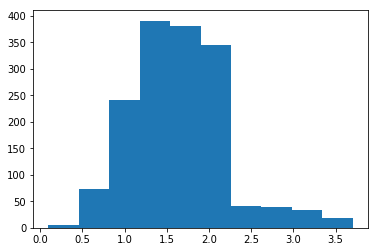

In [22]:
#look at the distance distribution
merged['dist_pc'].apply(np.log10).hist(grid = False);